## Exercise 2: Photo Sorting Application 📸

In this exercise, we want to use a model for classifying photos in the `exercise2_images` folder. 

Assume the photos are not tagged/labeled, andd you cannot use labeled data.


First, let's load the model and print some images.

In [1]:
import glob

In [2]:
image_paths = sorted(glob.glob('exercise2_images/*'))

In [3]:
len(image_paths)

47

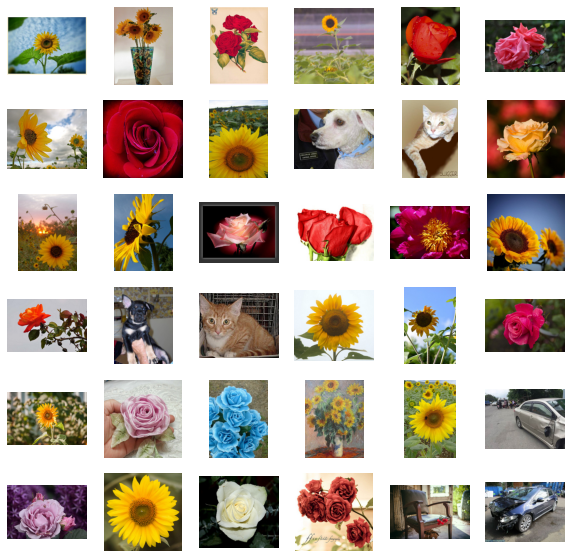

In [4]:
# display grid of images
import matplotlib.pyplot as plt

fig, axes = plt.subplots(6,6, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_paths[i]))
    ax.axis('off')

**a)** First, we want to classify the images into three groups:

* Photos of roses.
* Photos of sunflowers.
* Photos of other things.


For each of the photos, compute its vector representation into a matrix. 
After that, print each photo, and its corresponding classification into the three groups.

In [5]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

In [6]:
image_embeddings = []

for image_path in image_paths:
    image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
    
    with torch.no_grad():
        image_features = model.encode_image(image)
        image_features /= image_features.norm(dim=-1, keepdim=True)

    image_embeddings.append(image_features)

image_embeddings = torch.cat(image_embeddings)

In [7]:
image_embeddings.shape

torch.Size([47, 512])

In [8]:
labels = ['A photo of a rose', "A photo of a sunflower", "A photo"]

text = clip.tokenize(labels).to(device)

with torch.no_grad():
    text_features = model.encode_text(text)
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_features.shape

torch.Size([3, 512])

In [9]:
similarities = (100.0 * image_embeddings @ text_features.T).softmax(dim=-1)

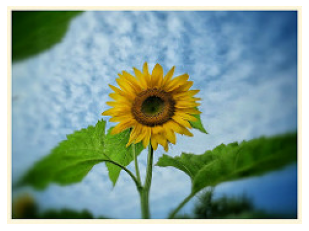

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


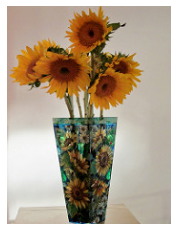

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


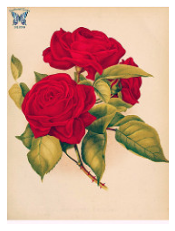

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


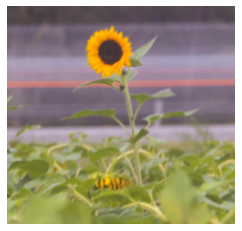

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


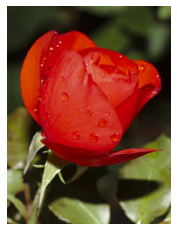

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


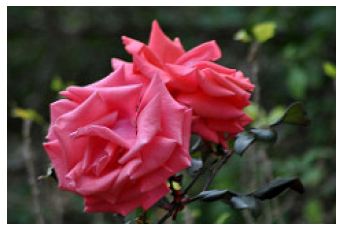

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


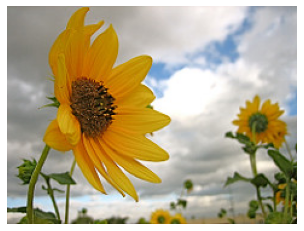

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


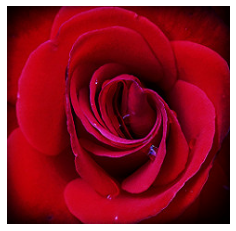

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


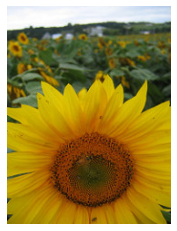

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


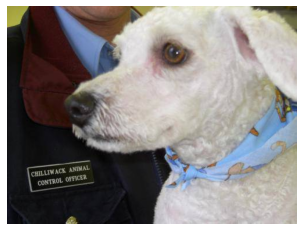

Similarity scores:
A photo of a rose: 0.02
A photo of a sunflower: 0.02
A photo: 0.96


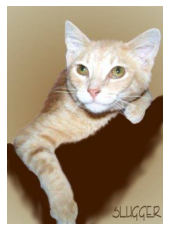

Similarity scores:
A photo of a rose: 0.01
A photo of a sunflower: 0.01
A photo: 0.98


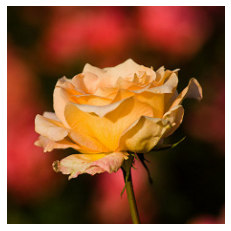

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


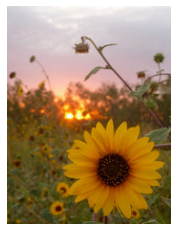

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


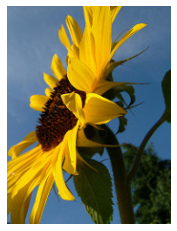

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


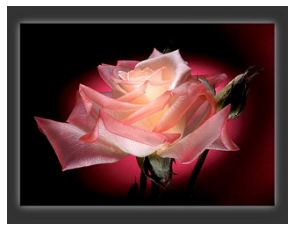

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


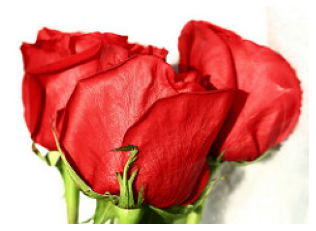

Similarity scores:
A photo of a rose: 0.99
A photo of a sunflower: 0.00
A photo: 0.01


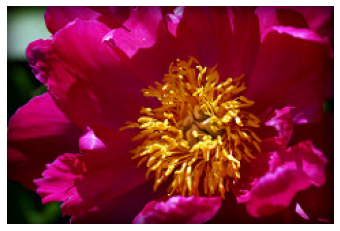

Similarity scores:
A photo of a rose: 0.95
A photo of a sunflower: 0.01
A photo: 0.04


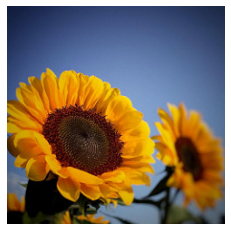

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


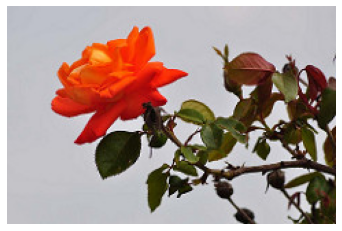

Similarity scores:
A photo of a rose: 0.99
A photo of a sunflower: 0.00
A photo: 0.01


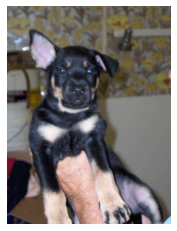

Similarity scores:
A photo of a rose: 0.04
A photo of a sunflower: 0.01
A photo: 0.95


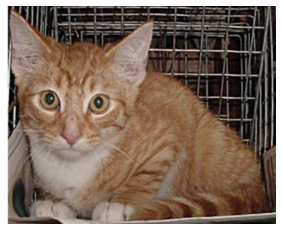

Similarity scores:
A photo of a rose: 0.01
A photo of a sunflower: 0.01
A photo: 0.99


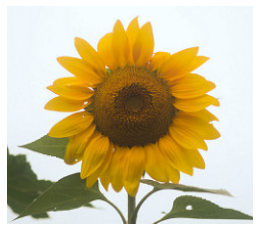

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


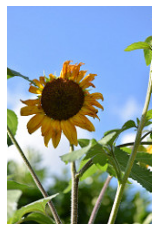

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


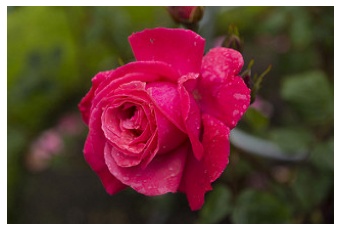

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


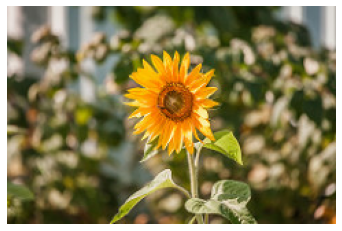

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


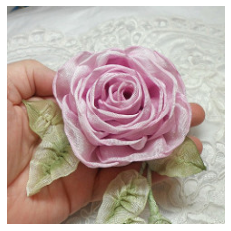

Similarity scores:
A photo of a rose: 0.99
A photo of a sunflower: 0.00
A photo: 0.01


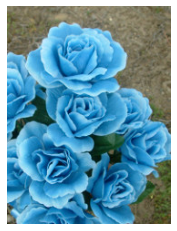

Similarity scores:
A photo of a rose: 0.98
A photo of a sunflower: 0.00
A photo: 0.02


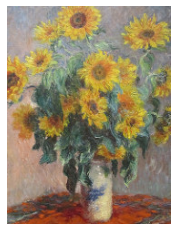

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 0.99
A photo: 0.01


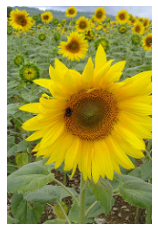

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


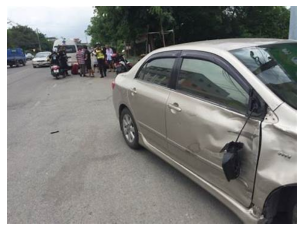

Similarity scores:
A photo of a rose: 0.04
A photo of a sunflower: 0.05
A photo: 0.91


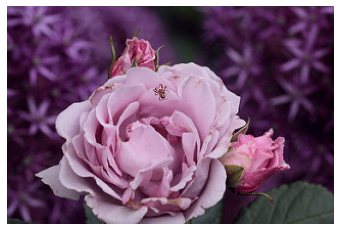

Similarity scores:
A photo of a rose: 0.97
A photo of a sunflower: 0.00
A photo: 0.03


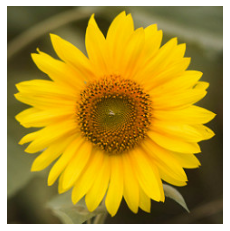

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


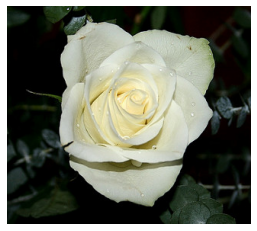

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


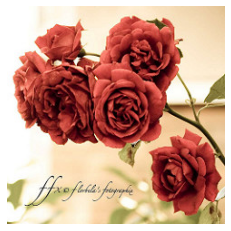

Similarity scores:
A photo of a rose: 0.96
A photo of a sunflower: 0.00
A photo: 0.04


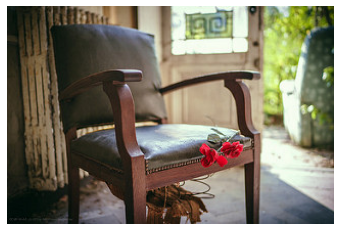

Similarity scores:
A photo of a rose: 0.91
A photo of a sunflower: 0.00
A photo: 0.09


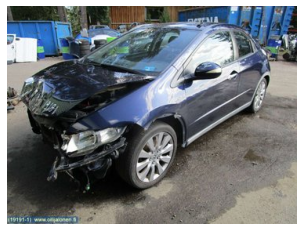

Similarity scores:
A photo of a rose: 0.01
A photo of a sunflower: 0.01
A photo: 0.98


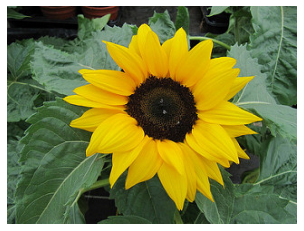

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


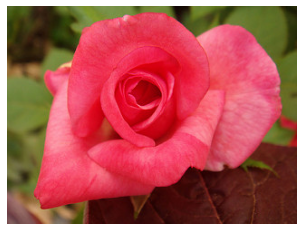

Similarity scores:
A photo of a rose: 1.00
A photo of a sunflower: 0.00
A photo: 0.00


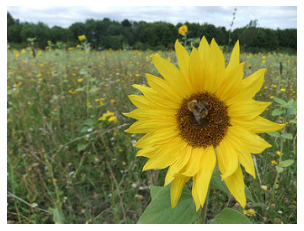

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


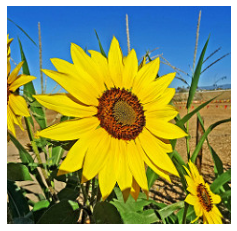

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


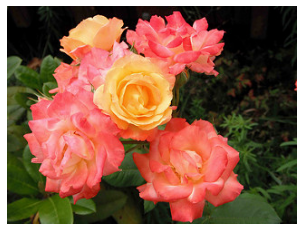

Similarity scores:
A photo of a rose: 0.99
A photo of a sunflower: 0.00
A photo: 0.01


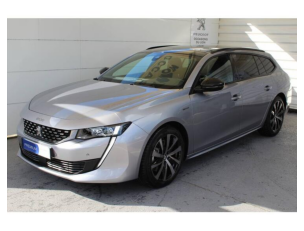

Similarity scores:
A photo of a rose: 0.01
A photo of a sunflower: 0.00
A photo: 0.99


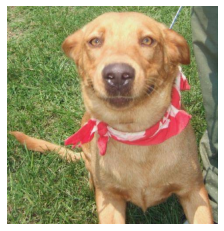

Similarity scores:
A photo of a rose: 0.08
A photo of a sunflower: 0.30
A photo: 0.62


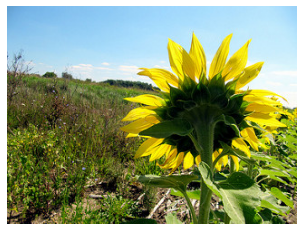

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


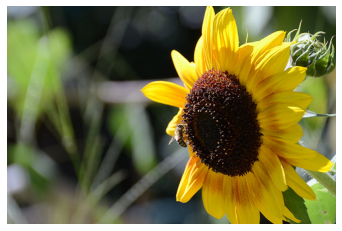

Similarity scores:
A photo of a rose: 0.00
A photo of a sunflower: 1.00
A photo: 0.00


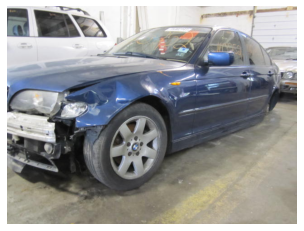

Similarity scores:
A photo of a rose: 0.02
A photo of a sunflower: 0.01
A photo: 0.97


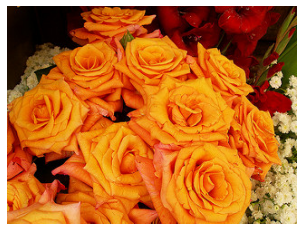

Similarity scores:
A photo of a rose: 0.94
A photo of a sunflower: 0.02
A photo: 0.05


In [10]:
for i, image_path in enumerate(image_paths):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print("Similarity scores:")
    for l, label in enumerate(labels):
        print(f"{label}: {similarities[i, l]:.2f}")

**b)** Let's say now we want to classify the same images into two groups:

* Photos of cars.
* The rest of the photos.

Do only the minimum changes to the previous code, and again, for each photo print the new classification.

In [11]:
labels = ['A photo of a car', "A photo"]

text = clip.tokenize(labels).to(device)

with torch.no_grad():
    text_features = model.encode_text(text)
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_features.shape

torch.Size([2, 512])

In [12]:
similarities = (100.0 * image_embeddings @ text_features.T).softmax(dim=-1)

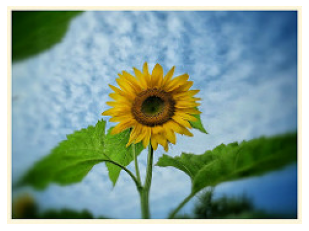

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


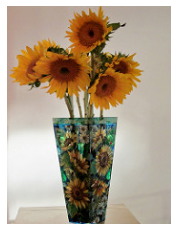

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


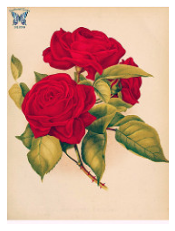

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


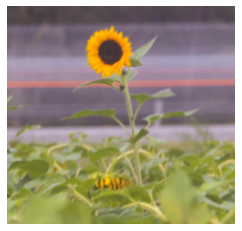

Similarity scores:
A photo of a car: 0.06
A photo: 0.94


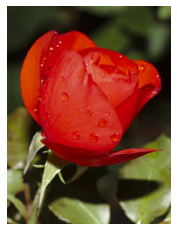

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


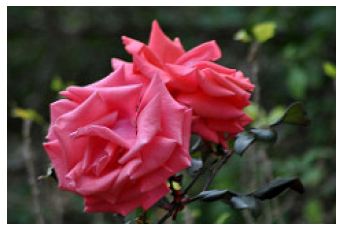

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


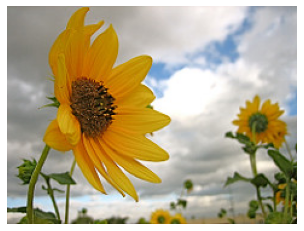

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


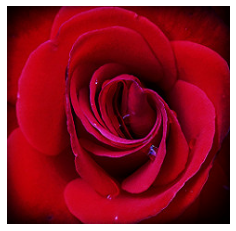

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


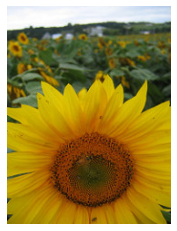

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


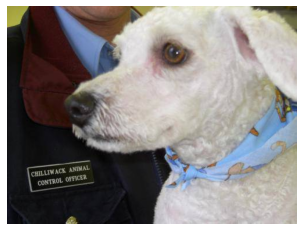

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


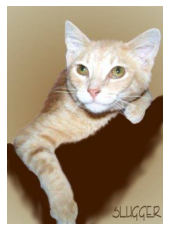

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


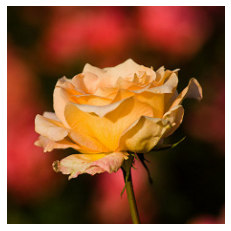

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


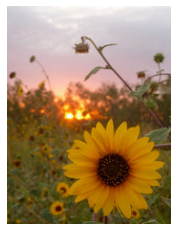

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


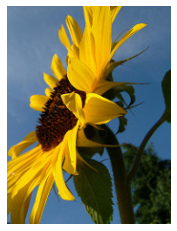

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


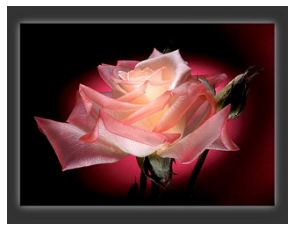

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


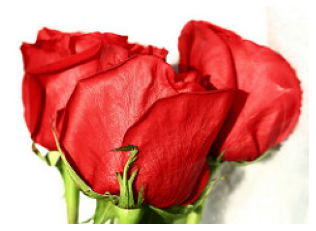

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


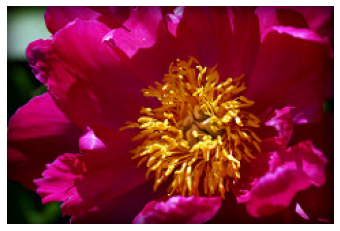

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


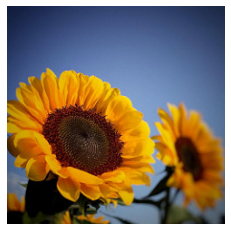

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


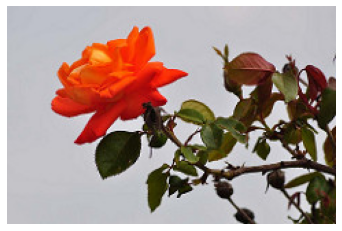

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


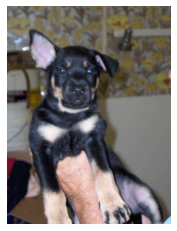

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


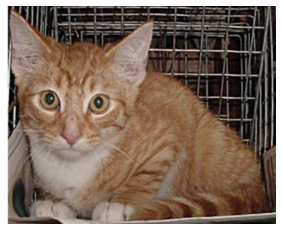

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


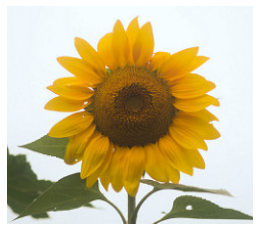

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


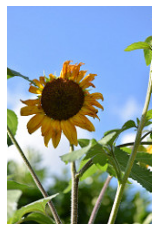

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


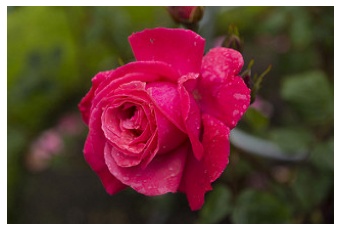

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


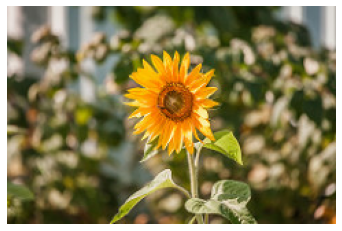

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


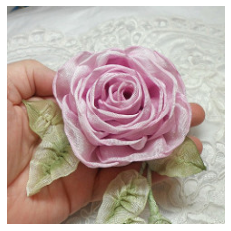

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


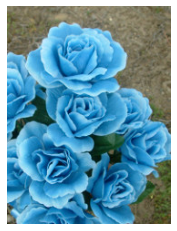

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


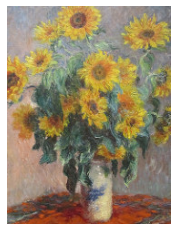

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


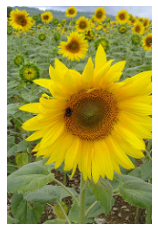

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


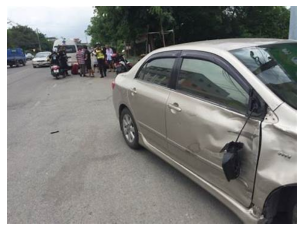

Similarity scores:
A photo of a car: 0.99
A photo: 0.01


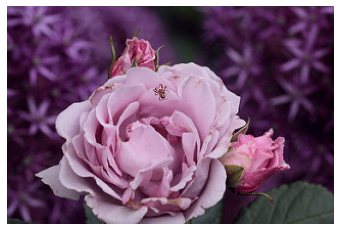

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


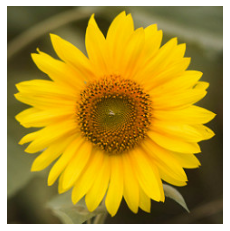

Similarity scores:
A photo of a car: 0.03
A photo: 0.97


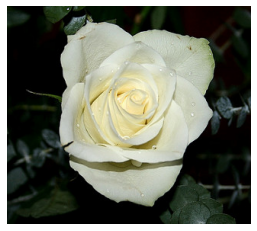

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


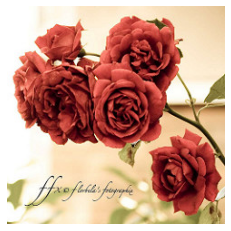

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


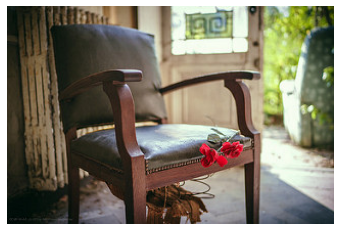

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


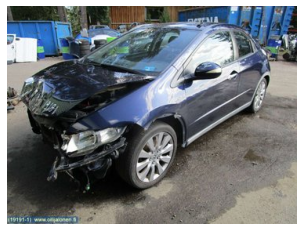

Similarity scores:
A photo of a car: 0.98
A photo: 0.02


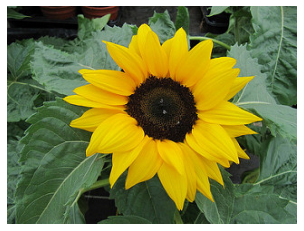

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


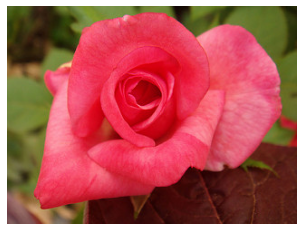

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


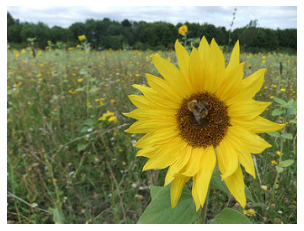

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


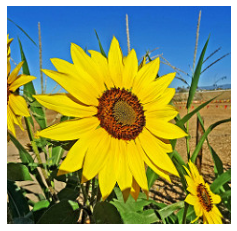

Similarity scores:
A photo of a car: 0.02
A photo: 0.98


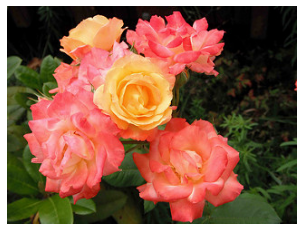

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


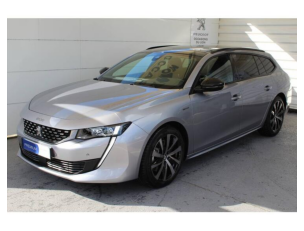

Similarity scores:
A photo of a car: 0.98
A photo: 0.02


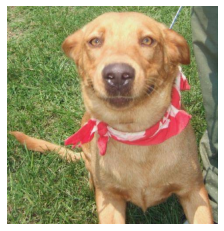

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


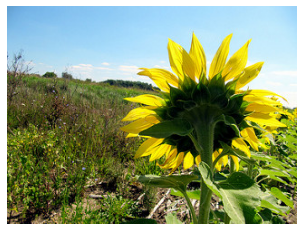

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


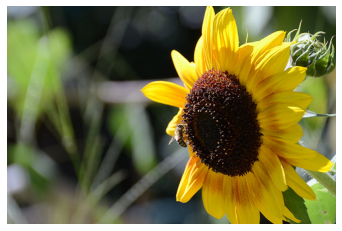

Similarity scores:
A photo of a car: 0.01
A photo: 0.99


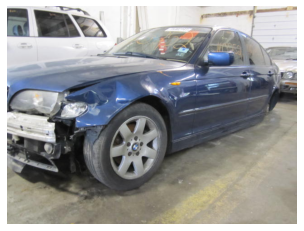

Similarity scores:
A photo of a car: 0.98
A photo: 0.02


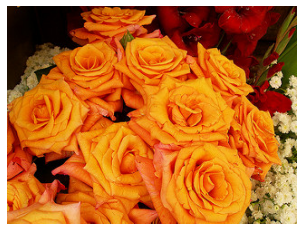

Similarity scores:
A photo of a car: 0.00
A photo: 1.00


In [13]:
for i, image_path in enumerate(image_paths):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print("Similarity scores:")
    for l, label in enumerate(labels):
        print(f"{label}: {similarities[i, l]:.2f}")

**c)** Without printing any photo, could you tell if there were any person's face in the photos?

In [18]:
labels = ["A person's face", "A photo"]

text = clip.tokenize(labels).to(device)

with torch.no_grad():
    text_features = model.encode_text(text)
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_features.shape

torch.Size([2, 512])

In [19]:
similarities = (100.0 * image_embeddings @ text_features.T).softmax(dim=-1)

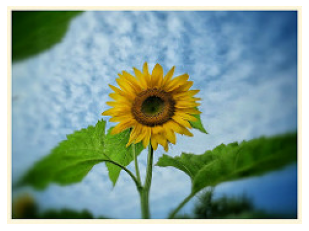

Similarity scores:
A person's face: 0.03
A photo: 0.97


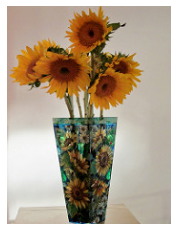

Similarity scores:
A person's face: 0.01
A photo: 0.99


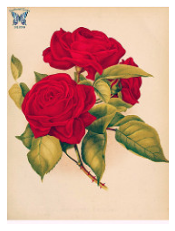

Similarity scores:
A person's face: 0.01
A photo: 0.99


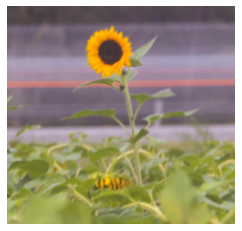

Similarity scores:
A person's face: 0.07
A photo: 0.93


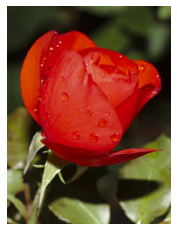

Similarity scores:
A person's face: 0.27
A photo: 0.73


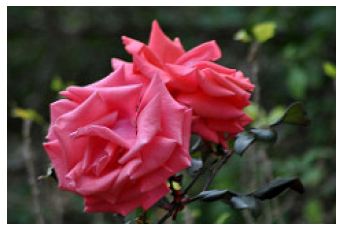

Similarity scores:
A person's face: 0.02
A photo: 0.98


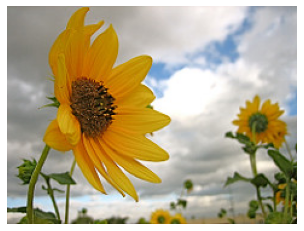

Similarity scores:
A person's face: 0.01
A photo: 0.99


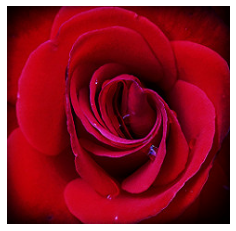

Similarity scores:
A person's face: 0.07
A photo: 0.93


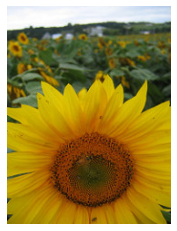

Similarity scores:
A person's face: 0.03
A photo: 0.97


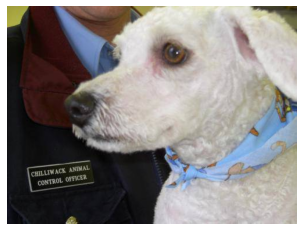

Similarity scores:
A person's face: 0.30
A photo: 0.70


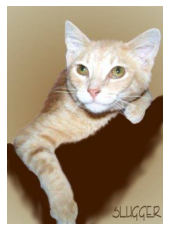

Similarity scores:
A person's face: 0.01
A photo: 0.99


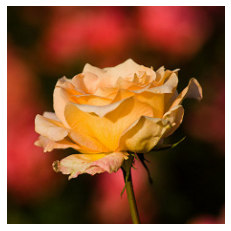

Similarity scores:
A person's face: 0.02
A photo: 0.98


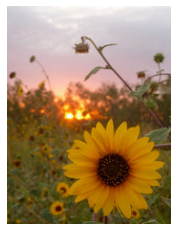

Similarity scores:
A person's face: 0.02
A photo: 0.98


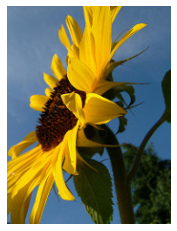

Similarity scores:
A person's face: 0.02
A photo: 0.98


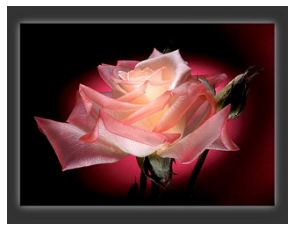

Similarity scores:
A person's face: 0.02
A photo: 0.98


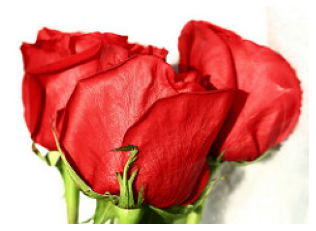

Similarity scores:
A person's face: 0.02
A photo: 0.98


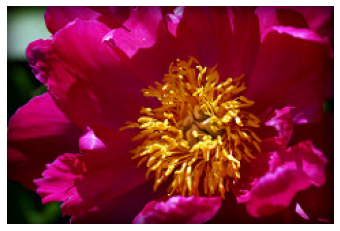

Similarity scores:
A person's face: 0.02
A photo: 0.98


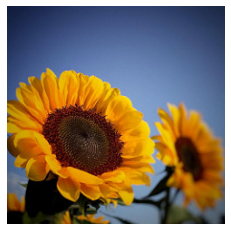

Similarity scores:
A person's face: 0.02
A photo: 0.98


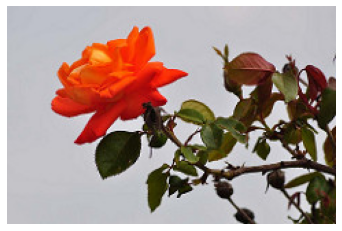

Similarity scores:
A person's face: 0.01
A photo: 0.99


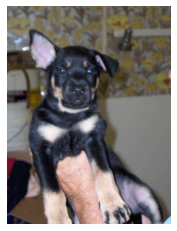

Similarity scores:
A person's face: 0.06
A photo: 0.94


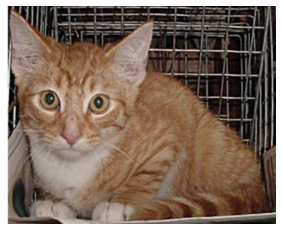

Similarity scores:
A person's face: 0.15
A photo: 0.85


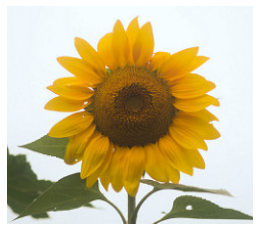

Similarity scores:
A person's face: 0.06
A photo: 0.94


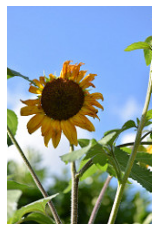

Similarity scores:
A person's face: 0.11
A photo: 0.89


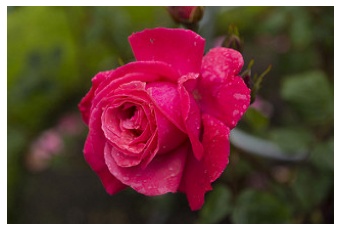

Similarity scores:
A person's face: 0.03
A photo: 0.97


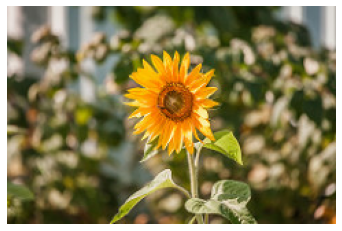

Similarity scores:
A person's face: 0.15
A photo: 0.85


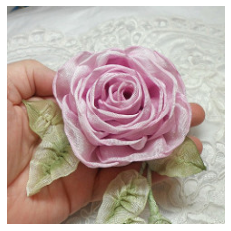

Similarity scores:
A person's face: 0.02
A photo: 0.98


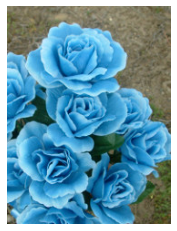

Similarity scores:
A person's face: 0.03
A photo: 0.97


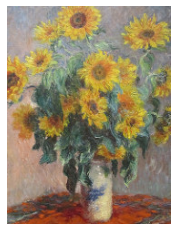

Similarity scores:
A person's face: 0.11
A photo: 0.89


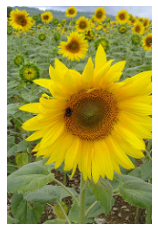

Similarity scores:
A person's face: 0.04
A photo: 0.96


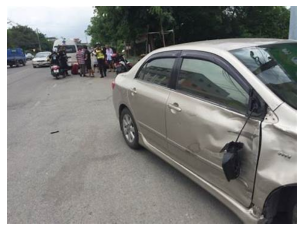

Similarity scores:
A person's face: 0.08
A photo: 0.92


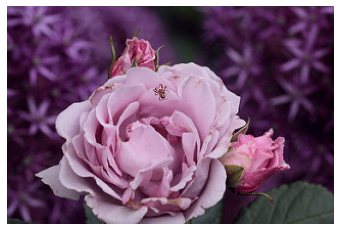

Similarity scores:
A person's face: 0.02
A photo: 0.98


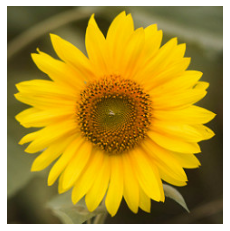

Similarity scores:
A person's face: 0.21
A photo: 0.79


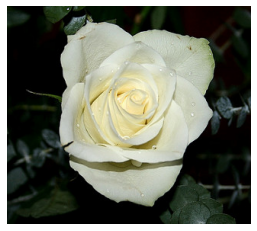

Similarity scores:
A person's face: 0.03
A photo: 0.97


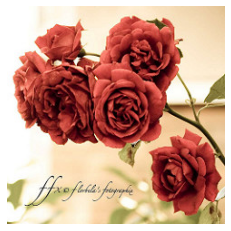

Similarity scores:
A person's face: 0.01
A photo: 0.99


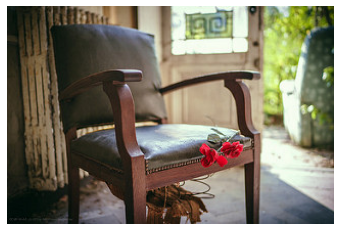

Similarity scores:
A person's face: 0.01
A photo: 0.99


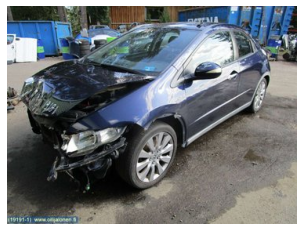

Similarity scores:
A person's face: 0.03
A photo: 0.97


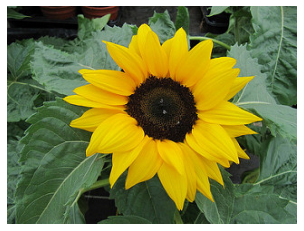

Similarity scores:
A person's face: 0.14
A photo: 0.86


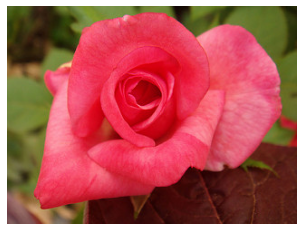

Similarity scores:
A person's face: 0.03
A photo: 0.97


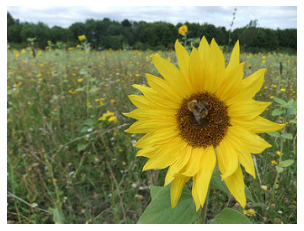

Similarity scores:
A person's face: 0.02
A photo: 0.98


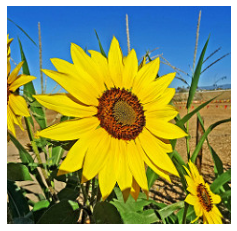

Similarity scores:
A person's face: 0.02
A photo: 0.98


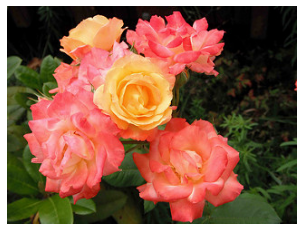

Similarity scores:
A person's face: 0.02
A photo: 0.98


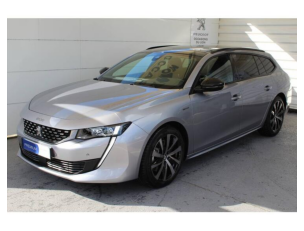

Similarity scores:
A person's face: 0.06
A photo: 0.94


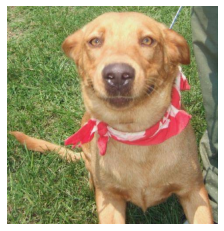

Similarity scores:
A person's face: 0.43
A photo: 0.57


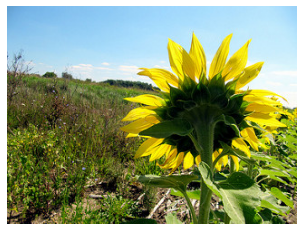

Similarity scores:
A person's face: 0.01
A photo: 0.99


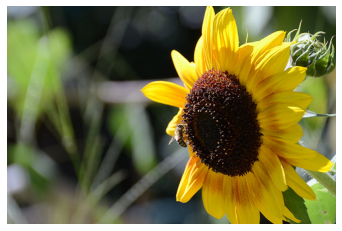

Similarity scores:
A person's face: 0.07
A photo: 0.93


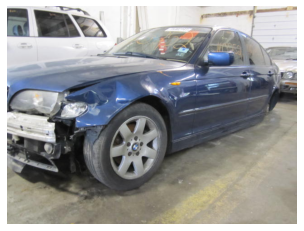

Similarity scores:
A person's face: 0.18
A photo: 0.82


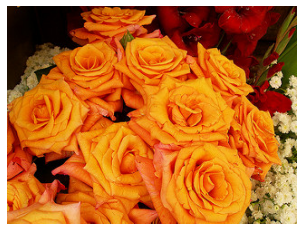

Similarity scores:
A person's face: 0.01
A photo: 0.99


In [20]:
for i, image_path in enumerate(image_paths):
    image = Image.open(image_path)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print("Similarity scores:")
    for l, label in enumerate(labels):
        print(f"{label}: {similarities[i, l]:.2f}")